In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
%config InlineBackend.figure_format = 'svg' 
plt.style.use('bmh')
plt.rcParams['image.cmap'] = 'Paired_r'
%matplotlib inline


### 1. Dataset

In [29]:
dataset = pd.read_csv("moonDataset.csv")
dataset

,X1,X2,X3,label
0,-0.926767,-0.111073,0.086017,0
1,-0.917583,0.706006,0.058041,0
2,0.437984,0.899093,0.072543,0
3,0.089694,0.291446,0.070444,1
4,0.110672,-0.070806,-0.090376,1
...,...,...,...,...
195,-0.540630,0.901834,-0.058539,0
196,0.032085,0.411465,-0.064823,1
197,0.691922,0.679103,0.020613,0
198,0.017034,0.930984,-0.034133,0


In [30]:

X = dataset[['X1', 'X2','X3']].values
y = dataset[['label']].values
Y=dataset[['label']]

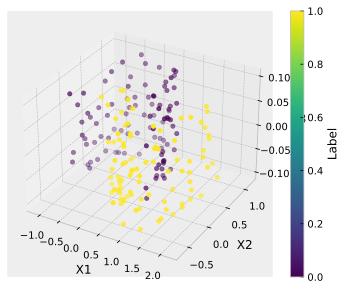

In [31]:
from mpl_toolkits.mplot3d import Axes3D

# Création de la figure 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Nuage de points avec couleurs selon la classe 'label'
scatter = ax.scatter(
    dataset['X1'],
    dataset['X2'],
    dataset['X3'],
    c=dataset['label'],
    cmap='viridis'
)

# Étiquettes des axes
ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('X3')

# Ajout d'une légende/couleur
fig.colorbar(scatter, label='Label')

plt.show()


In [32]:
Y = Y.values.reshape(-1, 1)

In [33]:
def mapFeature(X1, X2, X3, degree):
    res = np.zeros((X1.shape[0], 0))

    for i in range(1, degree + 1):
        for j in range(i + 1):
            for k in range(i - j + 1):
                l = i - j - k
                term = (X1 ** j) * (X2 ** k) * (X3 ** l)
                res = np.column_stack((res, term))
    return res


In [34]:
degree=4
Poly_X=mapFeature(X[:, 0],X[:, 1],X[:, 2],degree)

print(Poly_X.shape)

(200, 34)


In [35]:
print(Poly_X[:10])

[[ 8.60170928e-02 -1.11073008e-01 -9.26767105e-01  7.39894025e-03
  -9.55417722e-03  1.23372131e-02 -7.97178121e-02  1.02938810e-01
   8.58897268e-01  6.36435330e-04 -8.21822549e-04  1.06121120e-03
  -1.37033136e-03 -6.85709444e-03  8.85449717e-03 -1.14337232e-02
   7.38798460e-02 -9.54003029e-02 -7.95997735e-01  5.47443169e-05
  -7.06907864e-05  9.12823024e-05 -1.17871920e-04  1.52206826e-04
  -5.89827329e-04  7.61638105e-04 -9.83495633e-04  1.26997803e-03
   6.35492957e-03 -8.20605671e-03  1.05963986e-02 -6.84694110e-02
   8.84138626e-02  7.37704516e-01]
 [ 5.80406420e-02  7.06006215e-01 -9.17582924e-01  3.36871612e-03
   4.09770540e-02  4.98444776e-01 -5.32571020e-02 -6.47819248e-01
   8.41958423e-01  1.95522446e-04  2.37833452e-03  2.89300548e-02
   3.51905110e-01 -3.09107639e-03 -3.75998450e-02 -4.57364415e-01
   4.88678074e-02  5.94427880e-01 -7.72566672e-01  1.13482483e-05
   1.38040062e-04  1.67911895e-03  2.04247985e-02  2.48447195e-01
  -1.79408058e-04 -2.18231914e-03 -2.6545

In [36]:
# Séparer les données en ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(Poly_X, Y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(160, 34)
(40, 34)
(160, 1)
(40, 1)


### 2. Modèle


In [37]:
# La fonction sigmoide
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

In [38]:
def initialisation(X):
    np.random.seed(0)
    W = np.random.randn(X.shape[1], 1)
    b = np.random.randn(1)
    return (W, b)

In [39]:
# Modèle
def modele(X, W, b):
    Z = X.dot(W) + b
    A = sigmoid(Z)
    return A

W,b=initialisation(X)
modele(X, W, b)

### 3. Fonction Coût 

In [40]:
def log_loss(y, A):
    return 1/len(y) * np.sum(-y * np.log(A) - (1 - y) * np.log(1 - A))

### 4. Optimisation - Gradient et Descente de Gradient

In [41]:
def gradients(X, A, y):
    dW = 1/len(y) * np.dot(X.T, A - y)
    db = 1/len(y) * np.sum(A - y)
    return (dW, db)

In [42]:
def optimisation(X, W, b, A, y, learning_rate):
    dW, db = gradients(X, A, y)
    W = W - learning_rate * dW
    b = b - learning_rate * db
    return (W, b)

### 5. Prédiction

In [43]:
def predict(X, W, b):
    A = modele(X, W, b)
    #print(A)
    return A >= 0.5

### 5. Modèle final

In [44]:
def regression_logistique(X, y, learning_rate=0.01, n_iter=10000):
  # Initialisation
    W, b = initialisation(X)
    loss_history = []
  # Entrainement
    for i in range(n_iter):
        A = modele(X, W, b)
        loss_history.append(log_loss(y, A))
        W, b = optimisation(X, W, b, A, y, learning_rate=0.01)

  # Prediction
    plt.plot(loss_history)
    plt.xlabel('n_iteration')
    plt.ylabel('Log_loss')
    plt.title('Evolution des erreurs')
    return W,b

In [45]:
W,b=regression_logistique(X_train, y_train)

### 5. 1 Evaluation du modèle et Visualisation


In [46]:
from sklearn.metrics import accuracy_score
y_pred = predict(X_test, W, b)
print("Accuracy=",np.round(accuracy_score(y_test, y_pred)*100),'%')

Accuracy= 100.0 %


In [47]:

from sklearn.metrics import confusion_matrix
y_pred = predict(Poly_X, W, b)
cm = confusion_matrix(y, y_pred)
print(cm)

[[98  2]
 [ 3 97]]


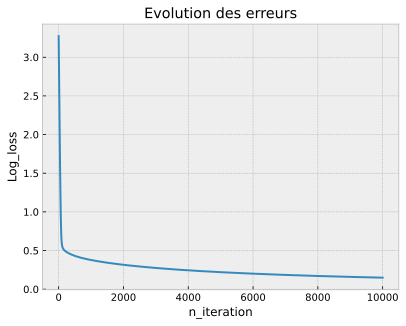

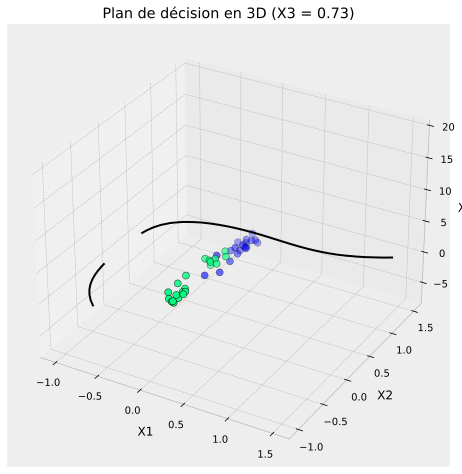

In [48]:

# Scatter 3D des points test
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(X_test[:, 0], X_test[:, 1], X_test[:, 2], c=y_test, cmap='winter', s=50, edgecolors='k')

# Création d'une grille (u, v), et on fixera X3 pour visualiser un plan à une valeur donnée
u = np.linspace(-1, 1.5, 30)
v = np.linspace(-1, 1.5, 30)
U, V = np.meshgrid(u, v)

# Fixer X3 à une valeur constante (ex. moyenne de X3)
X3_fixed = np.mean(X_test[:, 2])

# Aplatir U et V pour calculer les features
U_flat = U.ravel()
V_flat = V.ravel()
X3_flat = np.full_like(U_flat, X3_fixed)

# Mapping des features
X_poly = mapFeature(U_flat, V_flat, X3_flat, degree)

# Calcul de la fonction de décision : Z = W.T @ X + b
Z = X_poly.dot(W) + b
Z = Z.reshape(U.shape)

# Tracé du plan de décision Z = 0
ax.contour(U, V, Z, levels=[0], offset=X3_fixed, cmap="Greys_r", linewidths=2)

# Axes
ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('X3')
ax.set_title("Plan de décision en 3D (X3 = {:.2f})".format(X3_fixed))

plt.show()


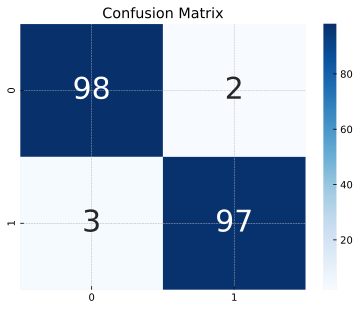

In [49]:
# Plot confusion matrix
import seaborn as sns
import pandas as pd
# confusion matrix sns heatmap 
## https://www.kaggle.com/agungor2/various-confusion-matrix-plots
ax = plt.axes()
df_cm = cm
sns.heatmap(df_cm, annot=True, annot_kws={"size": 30}, fmt='d',cmap="Blues", ax = ax )
ax.set_title('Confusion Matrix')
plt.show()

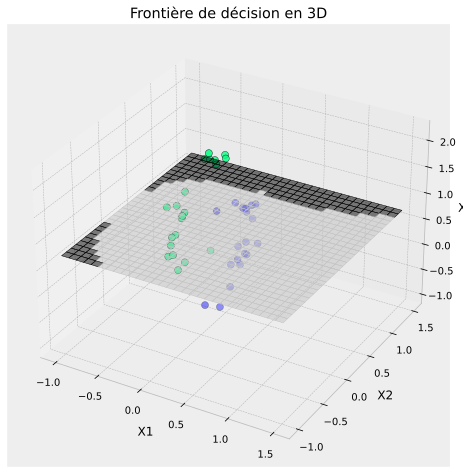

In [50]:
# Scatter 3D des points test
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(X_test[:, 0], X_test[:, 1], X_test[:, 2], c=y_test, cmap='winter', s=50, edgecolors='k')

# Création d'une grille (u, v)
u = np.linspace(-1, 1.5, 30)
v = np.linspace(-1, 1.5, 30)
U, V = np.meshgrid(u, v)

# Fixer X3 à une valeur constante (ex. moyenne de X3)
X3_fixed = np.mean(X_test[:, 2])

# Aplatir U et V pour calculer les features
U_flat = U.ravel()
V_flat = V.ravel()
X3_flat = np.full_like(U_flat, X3_fixed)

# Mapping des features
X_poly = mapFeature(U_flat, V_flat, X3_flat, degree)

# Calcul de la fonction de décision : Z = W.T @ X + b
Z = X_poly.dot(W) + b
Z = Z.reshape(U.shape)

# Tracé du plan de décision comme une surface
ax.plot_surface(U, V, np.ones_like(U)*X3_fixed, alpha=0.5, 
                facecolors=plt.cm.Greys_r((Z > 0).astype(float)), 
                rstride=1, cstride=1)

# Alternative: afficher un plan translucide coloré selon Z
# ax.plot_surface(U, V, np.ones_like(U)*X3_fixed, alpha=0.5,
#                facecolors=plt.cm.coolwarm(Z/np.max(np.abs(Z))))

# Axes
ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('X3')
ax.set_title("Frontière de décision en 3D")

plt.show()

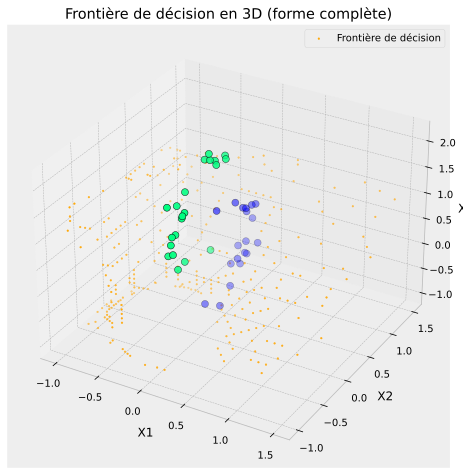

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Scatter des points test
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(X_test[:, 0], X_test[:, 1], X_test[:, 2], c=y_test, cmap='winter', s=50, edgecolors='k')

# Création d'une grille 3D dans l'espace (X1, X2, X3)
x = np.linspace(-1, 1.5, 30)
y = np.linspace(-1, 1.5, 30)
z = np.linspace(-1, 1.5, 30)
X1, X2, X3 = np.meshgrid(x, y, z)

# Aplatir pour créer les features
X1_flat = X1.ravel()
X2_flat = X2.ravel()
X3_flat = X3.ravel()

# Mapping des features polynomiaux
X_poly = mapFeature(X1_flat, X2_flat, X3_flat, degree)

# Calcul de la fonction de décision
Z = X_poly.dot(W) + b
Z = Z.reshape(X1.shape)

# Extraction de la surface Z ≈ 0 (frontière de décision)
# Iso-surface : on affiche les points où Z est proche de 0
decision_boundary = np.abs(Z) < 0.05  # seuil autour de 0
X1_db = X1[decision_boundary]
X2_db = X2[decision_boundary]
X3_db = X3[decision_boundary]

# Tracer la forme de la frontière de décision (ex : sphère, courbe, etc.)
ax.scatter(X1_db, X2_db, X3_db, color='orange', s=3, label='Frontière de décision')

# Axes et titre
ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('X3')
ax.set_title("Frontière de décision en 3D (forme complète)")

plt.legend()
plt.show()


In [52]:
import numpy as np
import plotly.graph_objects as go

# Grille
u = np.linspace(-1, 1.5, 50)
v = np.linspace(-1, 1.5, 50)
U, V = np.meshgrid(u, v)

# Fixer X3 à une valeur
X3_fixed = np.mean(X_test[:, 2])
X3_flat = np.full_like(U.ravel(), X3_fixed)

# Features et prédiction
X_poly = mapFeature(U.ravel(), V.ravel(), X3_flat, degree)
Z = X_poly.dot(W) + b
Z = Z.reshape(U.shape)

# === Plotly 3D ===
fig = go.Figure()

# Points test
fig.add_trace(go.Scatter3d(
    x=X_test[:, 0], y=X_test[:, 1], z=X_test[:, 2],
    mode='markers',
    marker=dict(size=5, color=y_test, colorscale='Blues', line=dict(width=1, color='black')),
    name='Points Test'
))

# Surface du plan de décision Z = 0 à X3_fixed
fig.add_trace(go.Surface(
    x=U, y=V, z=np.full_like(U, X3_fixed), surfacecolor=Z,
    colorscale='Greys', showscale=False, opacity=0.5,
    contours={"z": {"show": True, "start": 0, "end": 0, "size": 0.01, "color": "orange"}},
    name='Frontière Z=0'
))

fig.update_layout(
    title=f'Frontière de décision (X3 = {X3_fixed:.2f})',
    scene=dict(
        xaxis_title='X1',
        yaxis_title='X2',
        zaxis_title='X3',
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()


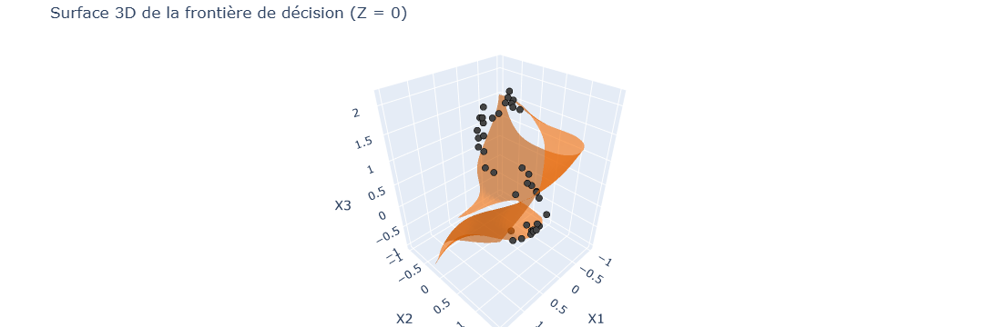

In [53]:
import numpy as np
import plotly.graph_objects as go

# 1. Grille 3D
x = np.linspace(-1, 1.5, 40)
y = np.linspace(-1, 1.5, 40)
z = np.linspace(-1, 1.5, 40)
X1, X2, X3 = np.meshgrid(x, y, z, indexing='ij')

# 2. Aplatir pour calculer les features
X1_flat = X1.ravel()
X2_flat = X2.ravel()
X3_flat = X3.ravel()

# 3. Features -> mapFeature
X_poly = mapFeature(X1_flat, X2_flat, X3_flat, degree)

# 4. Fonction de décision Z = W^T X + b
Z = X_poly.dot(W) + b
Z = Z.reshape(X1.shape)

# 5. Affichage Plotly avec Isosurface
fig = go.Figure()

# Points test
fig.add_trace(go.Scatter3d(
    x=X_test[:, 0], y=X_test[:, 1], z=X_test[:, 2],
    mode='markers',
    marker=dict(size=4, color=y_test, colorscale='Blues', line=dict(width=0.5, color='black')),
    name='Points test'
))

# Surface implicite Z = 0 (frontière de décision)
fig.add_trace(go.Isosurface(
    x=X1_flat, y=X2_flat, z=X3_flat, value=Z.ravel(),
    isomin=0, isomax=0,
    surface_count=1,
    caps=dict(x_show=False, y_show=False, z_show=False),
    colorscale='Hot', opacity=0.6,
    showscale=False,
    name='Frontière Z = 0'
))

fig.update_layout(
    title="Surface 3D de la frontière de décision (Z = 0)",
    scene=dict(
        xaxis_title='X1',
        yaxis_title='X2',
        zaxis_title='X3'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()
